**Exploratory Data Analysis**  
**Author: Ramesh Bhatta, CIS, RIT**

In [166]:
## Importing Packages

import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
import cmocean

In [167]:
## Predefined plot preferences--> This is my usual plot size reference

# Define text sizes
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

# Apply text size settings
plt.rc('font', size=SMALL_SIZE)          # Default font size
plt.rc('axes', titlesize=MEDIUM_SIZE)   # Axis title font size
plt.rc('axes', labelsize=MEDIUM_SIZE)   # Axis labels font size
plt.rc('xtick', labelsize=SMALL_SIZE)   # X-axis tick label font size
plt.rc('ytick', labelsize=SMALL_SIZE)   # Y-axis tick label font size
plt.rc('legend', fontsize=SMALL_SIZE)   # Legend font size
plt.rc('figure', titlesize=BIGGER_SIZE) # Figure title font size

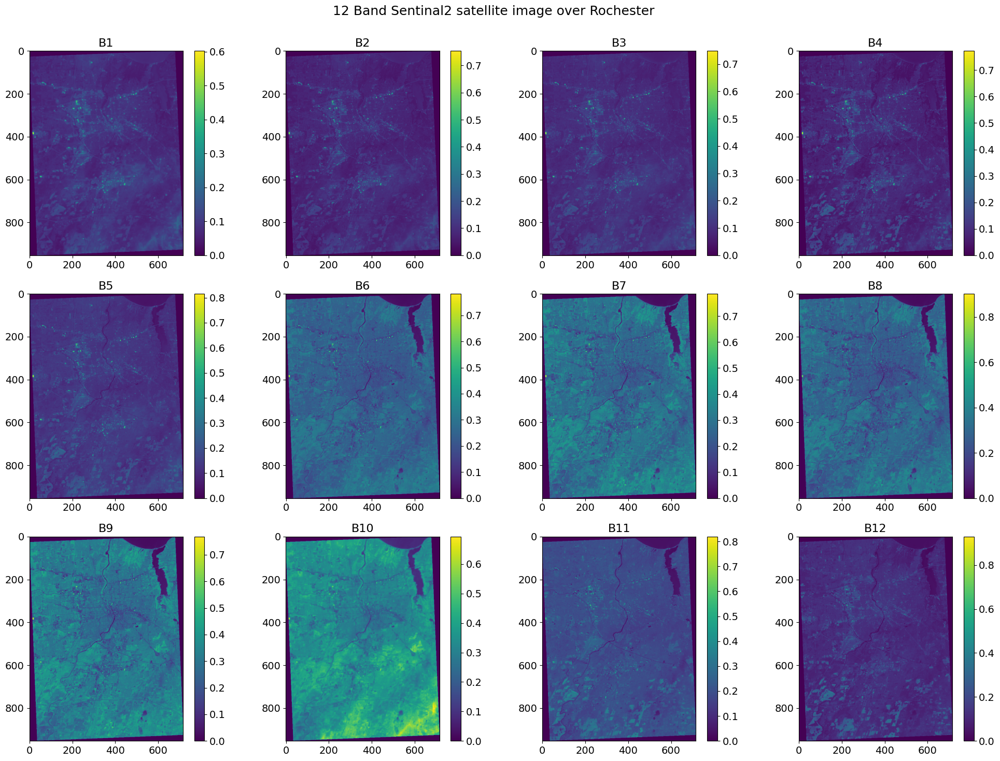

In [168]:
## 1. Read the sentinal2 data --> .npy format

Sen2_roc = np.load('./sentinel2_rochester.npy')

## Plot all Bands
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

# For 12 Bands
for i in range(12):
    
    ax = axs[i // 4, i % 4] 
    cax = ax.imshow(Sen2_roc[:, :, i], cmap='viridis')  
    ax.set_title(f'B{i+1}')
    fig.colorbar(cax, ax=ax, orientation='vertical')

# Tight Layout
plt.suptitle('12 Band Sentinal2 satellite image over Rochester\n')
plt.tight_layout()
plt.show()

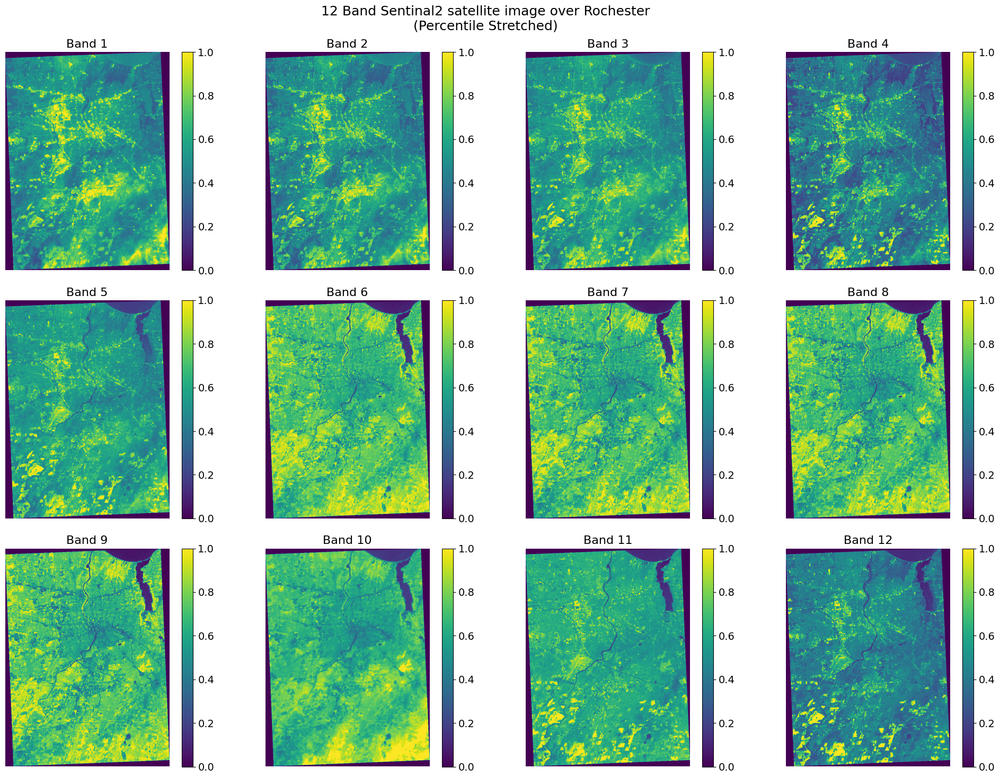

In [169]:
## 2. Using Percentile stretching for contrast enhancement

# Function to apply percentile stretching 
def percentile_stretch(band):
    p2, p98 = np.percentile(band, (2, 98))
    band = np.clip(band, p2, p98)
    return (band - p2) / (p98 - p2)

# Plot all bands
fig, axes = plt.subplots(3, 4, figsize=(20, 15))

# intialize stretched output bands
stretched_bands = np.zeros_like(Sen2_roc)

# Loop through the 12 bands 
for i in range(3):
    for j in range(4):
        band_idx = i * 4 + j
        if band_idx < Sen2_roc.shape[2]:  

            band = Sen2_roc[:, :, band_idx]
            
            # Band Stretching
            stretched_band = percentile_stretch(band)

            # Save the band stretched data
            stretched_bands[:, :, band_idx] = stretched_band

            # Plot each band
            ax = axes[i, j]
            cax = ax.imshow(stretched_band, cmap='viridis')  
            ax.set_title(f'Band {band_idx+1}')
            ax.axis('off')  
            fig.colorbar(cax, ax=ax, orientation='vertical')

# Tight layout
plt.suptitle('12 Band Sentinal2 satellite image over Rochester\n(Percentile Stretched)')
plt.tight_layout()
plt.show()


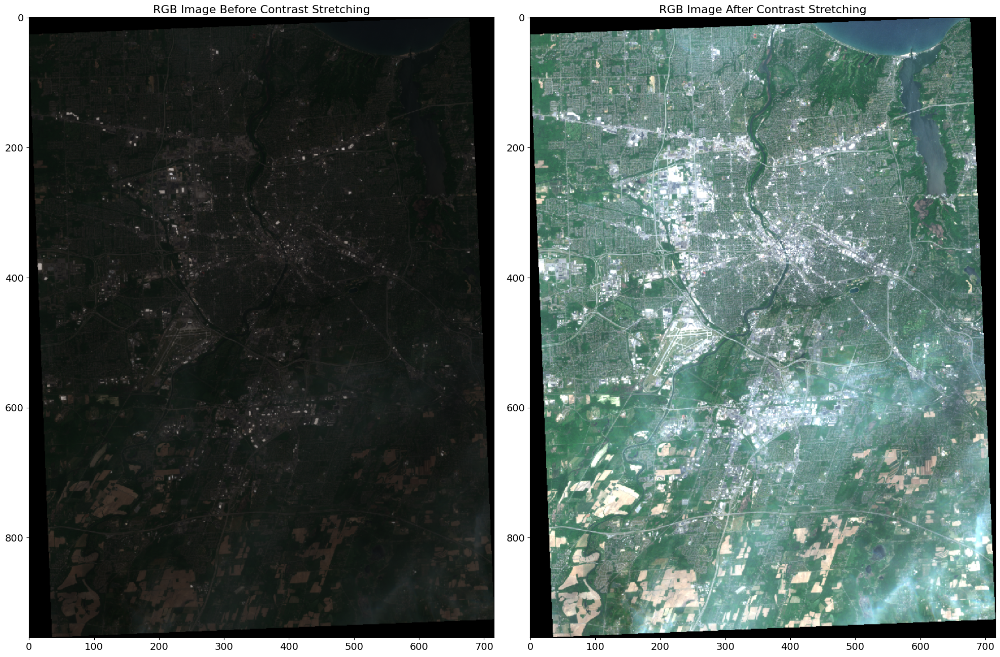

In [170]:
## 3. Before and After stretching

# Before stretch
b_before = Sen2_roc[:, :, 1]  
g_before = Sen2_roc[:, :, 2]  
r_before = Sen2_roc[:, :, 3]  

# Combine the bands
rgb_before = np.stack((r_before, g_before, b_before), axis=-1)

# Apply histogram stretching to the bands
b_after = stretched_bands[:, :, 1]
g_after = stretched_bands[:, :, 2]
r_after = stretched_bands[:, :, 3]

# Combine the three bands to form an RGB image after stretching
rgb_image_after = np.stack((r_after, g_after, b_after), axis=-1)

# Plot the Images
fig, axes = plt.subplots(1, 2, figsize=(20, 15))

axes[0].imshow(rgb_image_before)
axes[0].set_title("RGB Image Before Contrast Stretching")
axes[1].imshow(rgb_image_after)
axes[1].set_title("RGB Image After Contrast Stretching")

# Show the plot
plt.tight_layout()
plt.show()